In [2]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns


In [3]:
df = pd.read_csv("../data/raw/winequality-red.csv", sep=',')

In [4]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [5]:
df.head(2)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.0,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.0,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [7]:
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000



fixed acidity: Acidez fija.  
volatile acidity: Acidez volátil.  
citric acid: Ácido cítrico.  
residual sugar: Azúcar residual.  
chlorides: Cloruros.  
free sulfur dioxide: Dióxido de azufre libre.  
total sulfur dioxide: Dióxido de azufre total.  
density: Densidad.  
pH: Nivel de pH.  
sulphates: Sulfatos.  
alcohol: Contenido de alcohol.  
quality: Calidad del vino (variable objetivo).  


## LIMPIEZA DE DATOS

In [8]:
df.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

# Los registros 1561, 1562, 1563 al final del .csv son idénticos, hay duplicados.

In [9]:
df.duplicated().sum()

np.int64(240)

In [10]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [11]:
df.drop_duplicates()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
5,7.4,0.660,0.00,1.8,0.075,13.0,40.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1593,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5,6
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [12]:
df_vino = df.drop_duplicates()

In [13]:
df_vino

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
5,7.4,0.660,0.00,1.8,0.075,13.0,40.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1593,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5,6
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [14]:
df_vino.duplicated().sum()

np.int64(0)

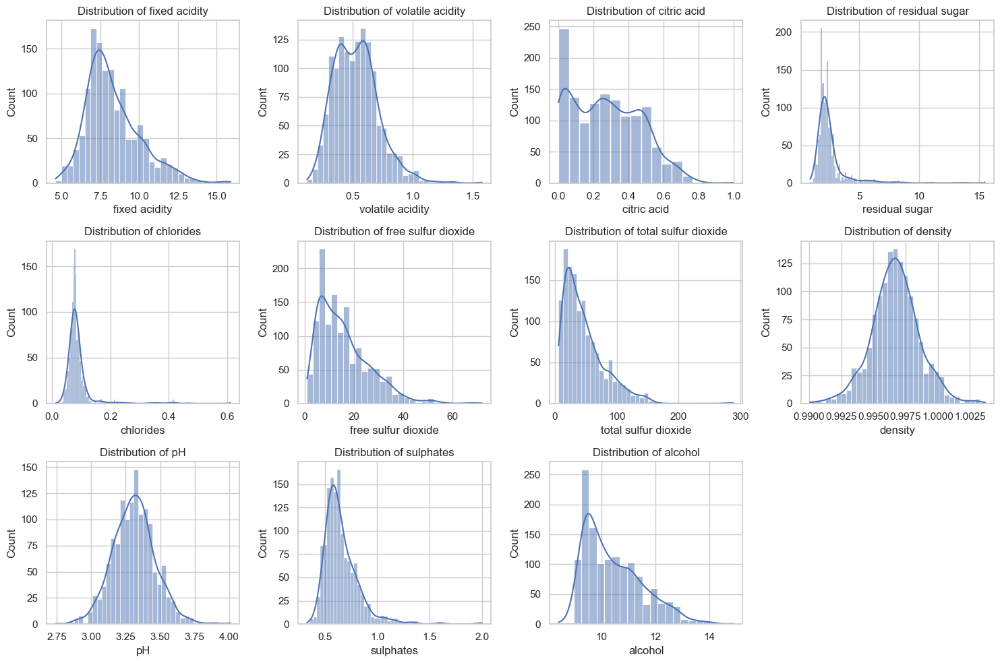

In [15]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Configurar el estilo de los gráficos
sns.set(style="whitegrid")

# Graficar histogramas para cada característica
plt.figure(figsize=(15, 10))
for i, column in enumerate(df_vino.columns[:-1], 1): 
    plt.subplot(3, 4, i)
    sns.histplot(df_vino[column], kde=True)
    plt.title(f'Distribution of {column}')
plt.tight_layout()
plt.show()


In [16]:
df_vino["quality"].value_counts()

quality
5    577
6    535
7    167
4     53
8     17
3     10
Name: count, dtype: int64

In [17]:
df_vino['quality_label'] = df_vino['quality'].apply(lambda q: 'baja' if q<=5 else ('media' if q==6 else 'alta'))

C:\Users\inaki\AppData\Local\Temp\ipykernel_6948\3770632103.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_vino['quality_label'] = df_vino['quality'].apply(lambda q: 'baja' if q<=5 else ('media' if q==6 else 'alta'))


In [18]:
df_vino

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,quality_label
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,baja
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,baja
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,baja
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,media
5,7.4,0.660,0.00,1.8,0.075,13.0,40.0,0.99780,3.51,0.56,9.4,5,baja
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1593,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5,6,media
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5,baja
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6,media
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5,baja


In [19]:
df_vino["quality_label"].value_counts()

quality_label
baja     640
media    535
alta     184
Name: count, dtype: int64

In [20]:
df_vino

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,quality_label
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,baja
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,baja
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,baja
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,media
5,7.4,0.660,0.00,1.8,0.075,13.0,40.0,0.99780,3.51,0.56,9.4,5,baja
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1593,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5,6,media
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5,baja
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6,media
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5,baja


In [21]:
df_vino.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1359 entries, 0 to 1598
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1359 non-null   float64
 1   volatile acidity      1359 non-null   float64
 2   citric acid           1359 non-null   float64
 3   residual sugar        1359 non-null   float64
 4   chlorides             1359 non-null   float64
 5   free sulfur dioxide   1359 non-null   float64
 6   total sulfur dioxide  1359 non-null   float64
 7   density               1359 non-null   float64
 8   pH                    1359 non-null   float64
 9   sulphates             1359 non-null   float64
 10  alcohol               1359 non-null   float64
 11  quality               1359 non-null   int64  
 12  quality_label         1359 non-null   object 
dtypes: float64(11), int64(1), object(1)
memory usage: 148.6+ KB


In [22]:
df_vino['quality_label']= df_vino['quality_label'].astype('string')

C:\Users\inaki\AppData\Local\Temp\ipykernel_6948\2694728732.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_vino['quality_label']= df_vino['quality_label'].astype('string')


In [23]:
df_vino.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1359 entries, 0 to 1598
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1359 non-null   float64
 1   volatile acidity      1359 non-null   float64
 2   citric acid           1359 non-null   float64
 3   residual sugar        1359 non-null   float64
 4   chlorides             1359 non-null   float64
 5   free sulfur dioxide   1359 non-null   float64
 6   total sulfur dioxide  1359 non-null   float64
 7   density               1359 non-null   float64
 8   pH                    1359 non-null   float64
 9   sulphates             1359 non-null   float64
 10  alcohol               1359 non-null   float64
 11  quality               1359 non-null   int64  
 12  quality_label         1359 non-null   string 
dtypes: float64(11), int64(1), string(1)
memory usage: 148.6 KB


In [24]:
# Graficar la matriz de correlación como un mapa de calor
plt.figure(figsize=(12, 8))
sns.heatmap(df_vino, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix for Wine Quality Dataset')
plt.show()

ValueError: could not convert string to float: 'baja'

<Figure size 1200x800 with 0 Axes>

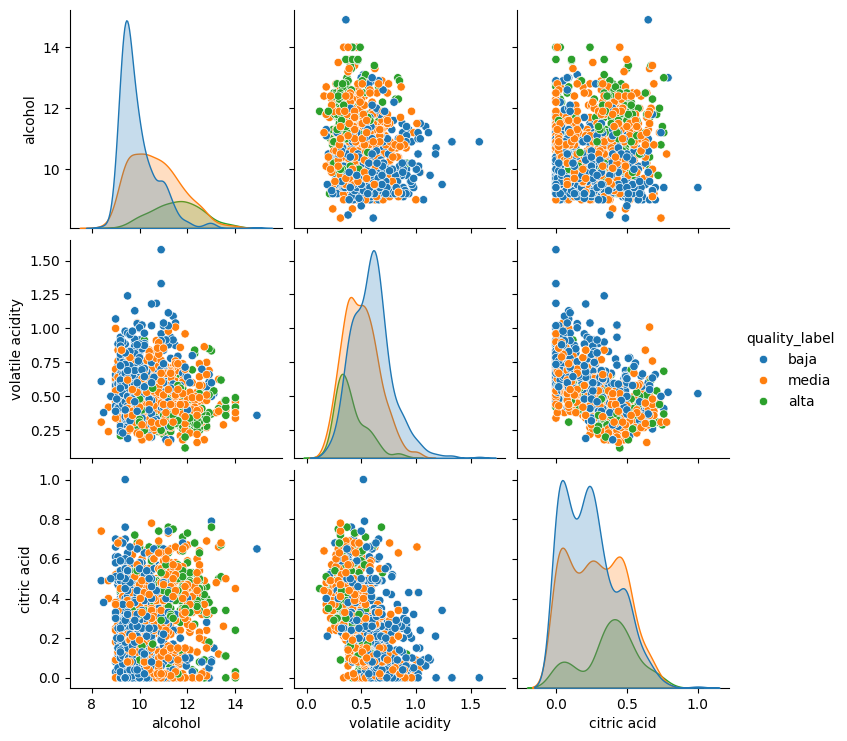

In [ ]:
#df_vino= df_vino[["alcohol","volatile acidity","citric acid","quality_label"]]
sns.pairplot(df_vino,hue='quality_label')

In [ ]:
df_vino['quality_label'] = df_vino['quality_label'].astype('string')

In [ ]:
df_vino.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1359 entries, 0 to 1598
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   alcohol           1359 non-null   float64
 1   volatile acidity  1359 non-null   float64
 2   citric acid       1359 non-null   float64
 3   quality_label     1359 non-null   string 
dtypes: float64(3), string(1)
memory usage: 53.1 KB


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns



# Calcular la matriz de correlación
df_vino.corr()

# Graficar la matriz de correlación como un mapa de calor
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix for Wine Quality Dataset')
plt.show()

NameError: name 'df_vino' is not defined

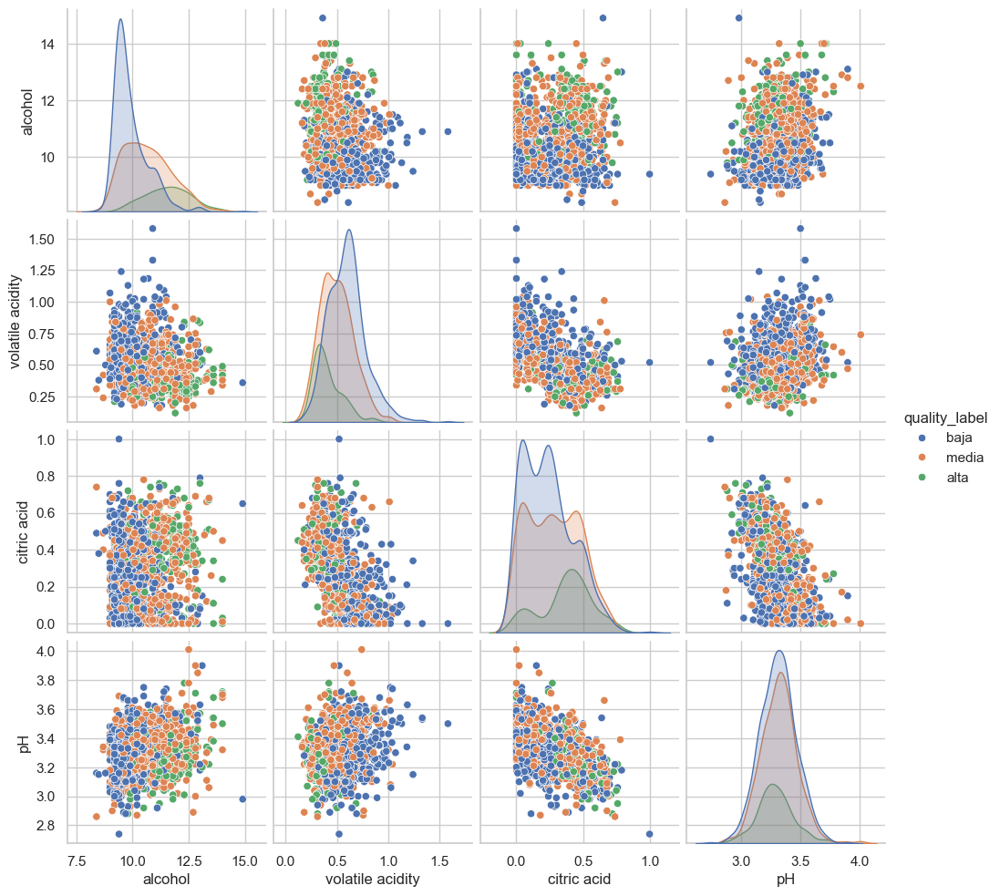

In [ ]:
df_vino= df_vino[["alcohol","volatile acidity","citric acid","quality_label", 'pH']]
sns.pairplot(df_vino,hue='quality_label')

In [ ]:
df_vino

,alcohol,volatile acidity,citric acid,quality_label
0,9.4,0.700,0.00,baja
1,9.8,0.880,0.00,baja
2,9.8,0.760,0.04,baja
3,9.8,0.280,0.56,media
4,9.4,0.660,0.00,baja
...,...,...,...,...
1354,9.5,0.620,0.08,media
1355,10.5,0.600,0.08,baja
1356,11.2,0.550,0.10,media
1357,10.2,0.645,0.12,baja


In [ ]:
df_vino["quality_label"].value_counts()

quality_label
baja     640
media    535
alta     184
Name: count, dtype: int64


fixed acidity: La mayoría de los valores están entre 7 y 10, con una distribución aproximadamente normal.  

volatile acidity: Tiene una distribución sesgada a la derecha, con la mayoría de los valores cerca de 0.5.   

citric acid: La mayoría de los valores están cerca de 0, con una distribución sesgada a la derecha.  

residual sugar: La mayoría de los valores están entre 1 y 3, con algunos valores atípicos más altos.  

chlorides: La mayoría de los valores están cerca de 0.07, con una distribución sesgada a la derecha.  

free sulfur dioxide y total sulfur dioxide: Ambas tienen distribuciones sesgadas a la derecha.  

density: Tiene una distribución aproximadamente normal centrada alrededor de 0.996.  

pH: Tiene una distribución aproximadamente normal centrada alrededor de 3.3.  

sulphates: Tiene una distribución aproximadamente normal centrada alrededor de 0.65.  

alcohol: Tiene una distribución aproximadamente normal centrada alrededor de 10.5.  

quality: La calidad del vino varía de 3 a 8, con la mayoría de los valores entre 5 y 6.  


In [ ]:
# import os

# # Ruta completa donde guardar el archivo
# ruta_archivo = "../data/processed/vinotinto.csv"

# # Crear la carpeta si no existe
# os.makedirs(os.path.dirname(ruta_archivo), exist_ok=True)

# # Guardar el DataFrame como CSV
# df_vino.to_csv(ruta_archivo, index=False)


---------------------------------------------------------------------------------------------------------

-----------------------------------------------------------------------

### VISUALIZACIONES

### HISTOGRAMA

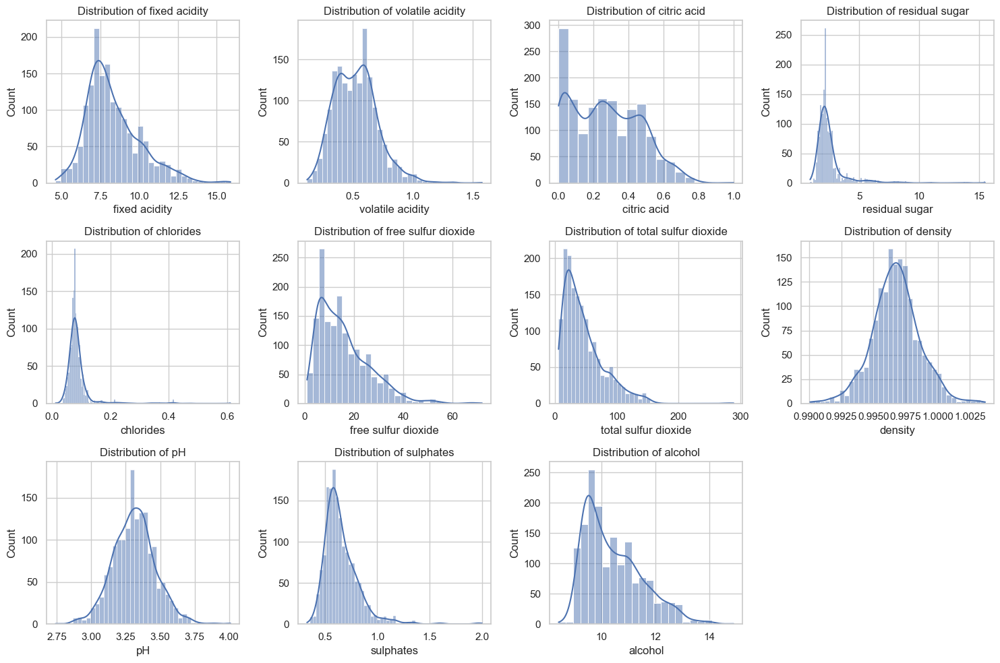

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Cargar los datos
df_vino = pd.read_csv('../data/processed/vinotinto.csv')

# Configurar el estilo de los gráficos
sns.set(style="whitegrid")

# Graficar histogramas para cada característica
plt.figure(figsize=(15, 10))
for i, column in enumerate(df.columns[:-1], 1): 
    plt.subplot(3, 4, i)
    sns.histplot(df[column], kde=True)
    plt.title(f'Distribution of {column}')
plt.tight_layout()
plt.show()



fixed acidity: La mayoría de los valores están entre 7 y 10, con una distribución aproximadamente normal.  

volatile acidity: Tiene una distribución sesgada a la derecha, con la mayoría de los valores cerca de 0.5.   

citric acid: La mayoría de los valores están cerca de 0, con una distribución sesgada a la derecha.  

residual sugar: La mayoría de los valores están entre 1 y 3, con algunos valores atípicos más altos.  

chlorides: La mayoría de los valores están cerca de 0.07, con una distribución sesgada a la derecha.  

free sulfur dioxide y total sulfur dioxide: Ambas tienen distribuciones sesgadas a la derecha.  

density: Tiene una distribución aproximadamente normal centrada alrededor de 0.996.  

pH: Tiene una distribución aproximadamente normal centrada alrededor de 3.3.  

sulphates: Tiene una distribución aproximadamente normal centrada alrededor de 0.65.  

alcohol: Tiene una distribución aproximadamente normal centrada alrededor de 10.5.  

quality: La calidad del vino varía de 3 a 8, con la mayoría de los valores entre 5 y 6.  


In [ ]:
df["quality"].value_counts()

quality
5    681
6    638
7    199
4     53
8     18
3     10
Name: count, dtype: int64

-----------------------------------------------------------

In [ ]:
df_2= df[["alcohol","volatile acidity","citric acid","quality"]]

In [ ]:
df_2

,alcohol,volatile acidity,citric acid,quality
0,9.4,0.700,0.00,5
1,9.8,0.880,0.00,5
2,9.8,0.760,0.04,5
3,9.8,0.280,0.56,6
4,9.4,0.700,0.00,5
...,...,...,...,...
1594,10.5,0.600,0.08,5
1595,11.2,0.550,0.10,6
1596,11.0,0.510,0.13,6
1597,10.2,0.645,0.12,5


In [ ]:
df_2= df

In [ ]:
df_2['quality_label'] = df['quality'].apply(lambda q: 'baja' if q<=5 else ('media' if q==6 else 'alta'))

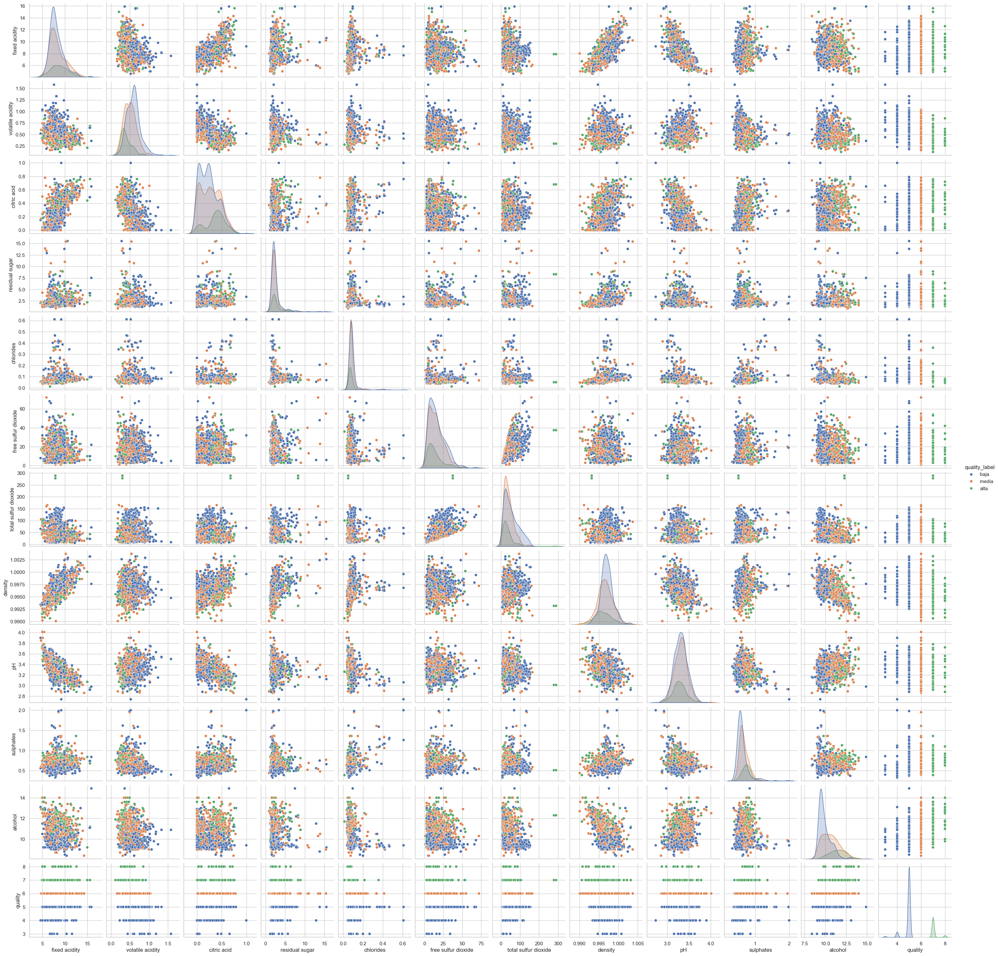

In [ ]:
sns.pairplot(df_2,hue='quality_label')

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns



# Calcular la matriz de correlación
correlation_matrix = df_vino.corr()

# Graficar la matriz de correlación como un mapa de calor
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix for Wine Quality Dataset')
plt.show()

NameError: name 'df_vino' is not defined

### Matriz de Correlación


Alcohol tiene una correlación positiva moderada con la calidad (0.48), lo que sugiere que los vinos con mayor contenido de alcohol tienden a tener una mejor calidad.  

Volatile acidity tiene una correlación 
negativa moderada con la calidad (-0.39), lo que indica que un aumento en la acidez volátil podría disminuir la calidad del vino.  

Citric acid y sulphates también tienen correlaciones positivas con la calidad, aunque son más débiles.  

pH y density tienen correlaciones negativas con la calidad, pero son relativamente débiles.  

Fixed acidity, residual sugar, chlorides, free sulfur dioxide, y total sulfur dioxide tienen correlaciones cercanas a cero con la calidad, lo que sugiere que su impacto directo en la calidad podría ser menos significativo.  


----------------------------------------------------------------------

Feature Engineering: Crear alguna característica adicional que podría ser útil para el modelo.  

Por ejemplo, podríamos calcular la relación entre el alcohol y la acidez volátil, ya que estas características tienen correlaciones significativas con la calidad.  

División de Datos: Dividiremos el conjunto de datos en características (variables independientes) y la variable objetivo (calidad).   
Luego, dividiremos estos datos en conjuntos de entrenamiento y prueba.

In [ ]:
# relación entre el alcohol y la acidez volátil.

df_2['alcohol_to_volatile_acidity'] = df_2['alcohol'] / df_2['volatile acidity']

# relacion entre el pH y la densidad

df_2['ph_to_density'] = df_2['pH'] / df_2['density']

In [ ]:
df_2

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,quality_label,alcohol_to_volatile_acidity,ph_to_density
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,baja,13.428571,3.517739
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,baja,11.136364,3.210273
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,baja,12.894737,3.269809
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,media,35.000000,3.166333
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,baja,13.428571,3.517739
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5,baja,17.500000,3.467685
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6,media,20.363636,3.537262
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6,media,21.568627,3.434632
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5,baja,15.813953,3.586246


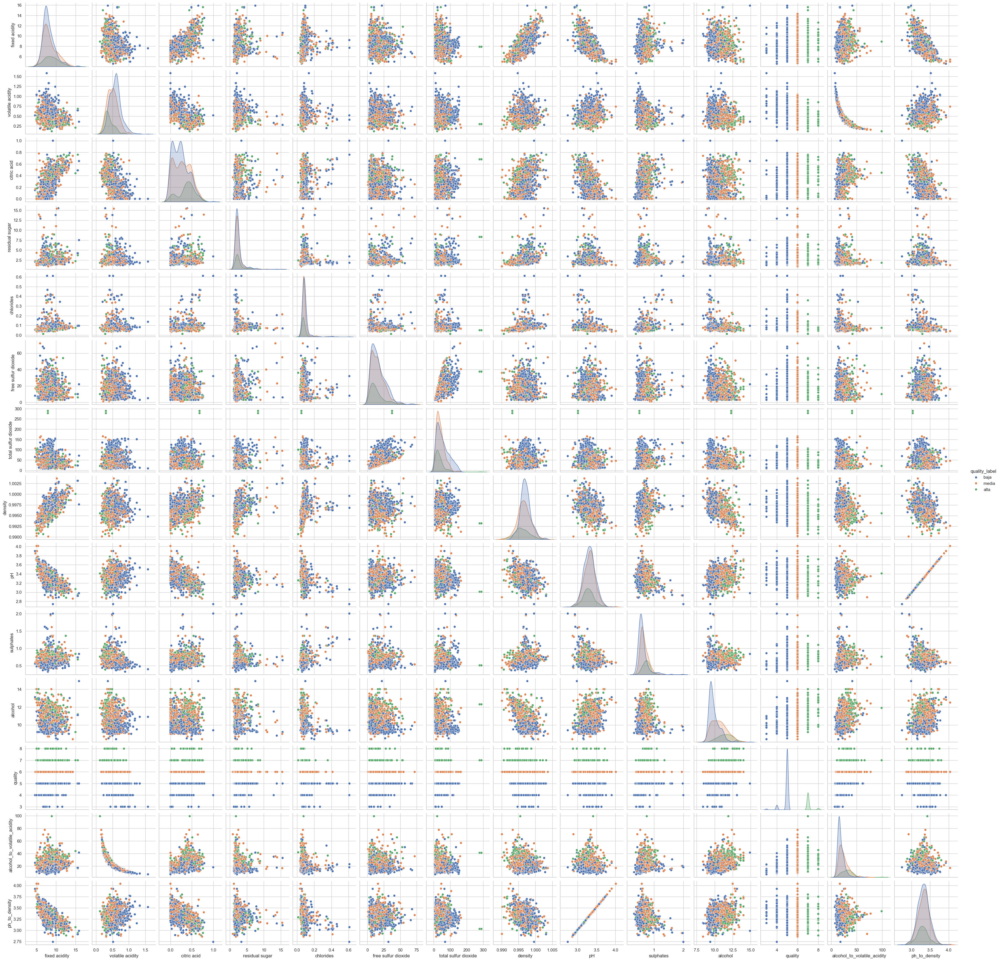

In [ ]:
sns.pairplot(df_2,hue='quality_label')

In [ ]:
df_2= df_2[["alcohol" , "volatile acidity","citric acid",'alcohol_to_volatile_acidity',"ph_to_density", "quality_label"]]

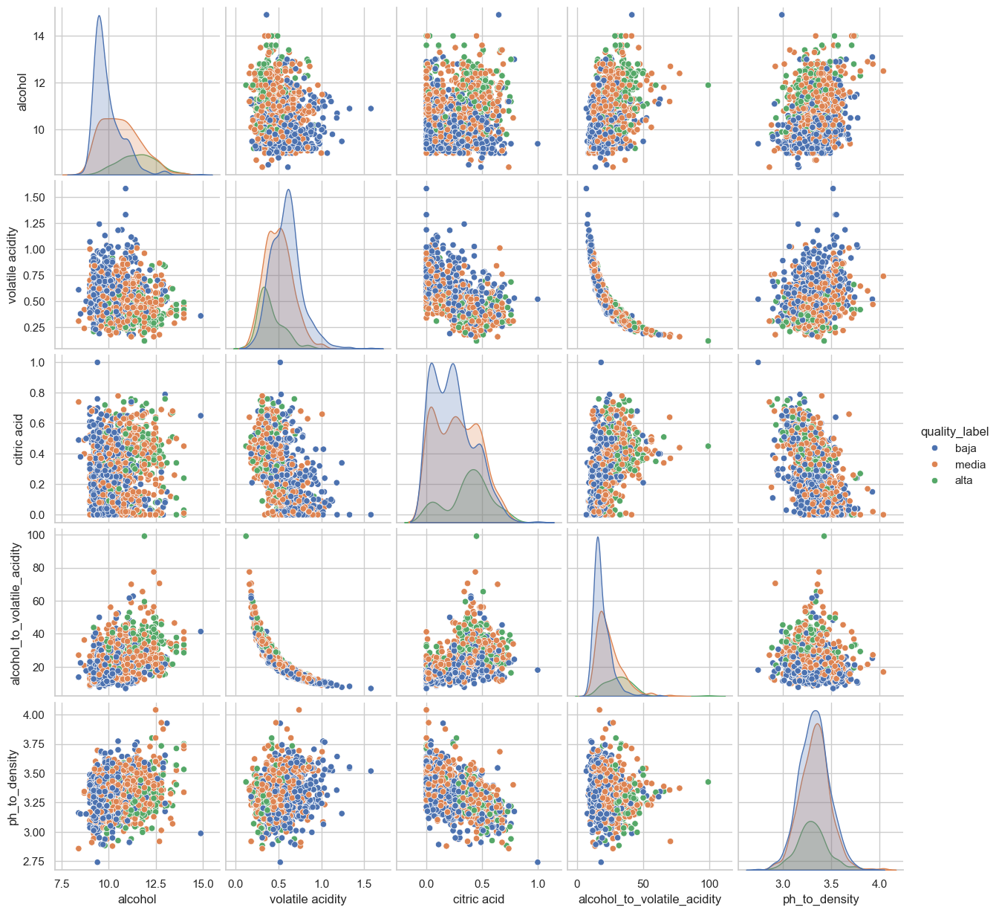

In [ ]:
sns.pairplot(df_2,hue='quality_label')

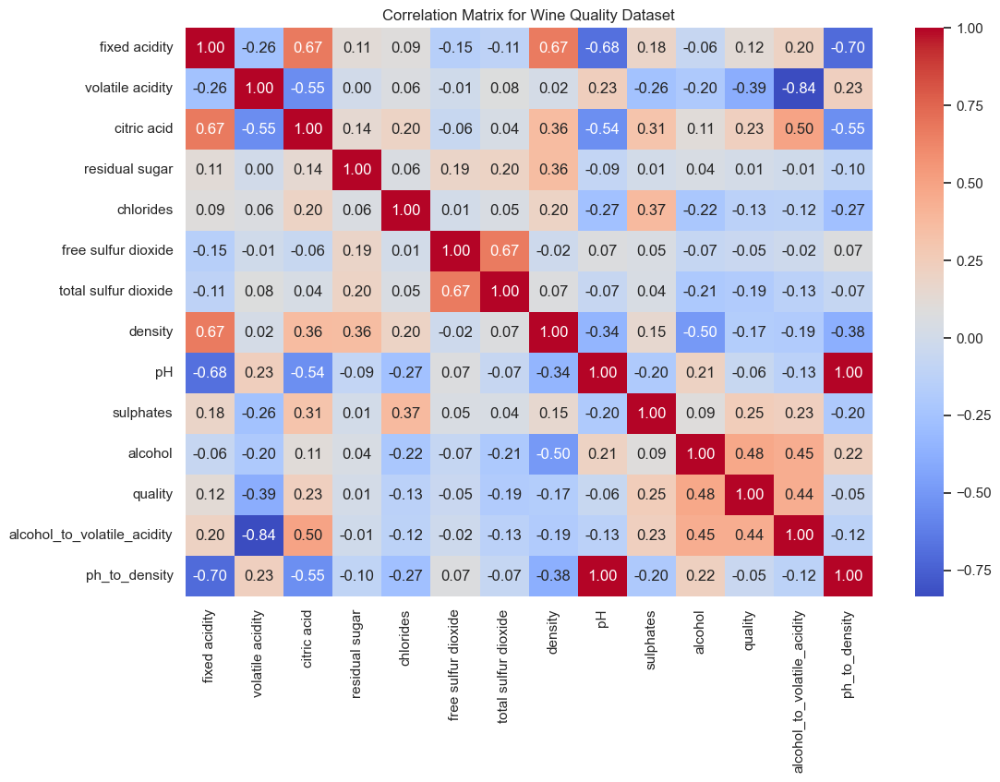

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Cargar los datos
df_vino = pd.read_csv('../data/processed/vinotinto.csv')

# Calcular la matriz de correlación
correlation_matrix = df.corr()

# Graficar la matriz de correlación como un mapa de calor
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix for Wine Quality Dataset')
plt.show()

MODELO VECTORES!!!!!!! 

## MODELOS

-----------------------------------------------------------------------------------

## 1. LINEAR REGRESION

In [ ]:
from sklearn.model_selection import train_test_split


# Separar entre variables predictoras y variable a predecir.
X = df.drop('quality', axis=1)
y = df['quality']



# Dividir los datos para entrenar y testear el modelo.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((1279, 13), (320, 13), (1279,), (320,))

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Initialize models
linear_regression = LinearRegression()
decision_tree = DecisionTreeRegressor(random_state=42)

# Train models
linear_regression.fit(X_train, y_train)
decision_tree.fit(X_train, y_train)

# Predict on the test set
y_pred_lr = linear_regression.predict(X_test)
y_pred_dt = decision_tree.predict(X_test)

# Evaluate models
mse_lr = mean_squared_error(y_test, y_pred_lr)
r2_lr = r2_score(y_test, y_pred_lr)

mse_dt = mean_squared_error(y_test, y_pred_dt)
r2_dt = r2_score(y_test, y_pred_dt)

mse_lr, r2_lr, mse_dt, r2_dt

(0.39113992847560536, 0.40147448892090454, 0.70625, -0.08070951448766417)

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Cargar los datos desde un archivo CSV
data = pd.read_csv('../data/raw/winequality-red.csv')

# Verificar valores faltantes en el conjunto de datos
missing_values = data.isnull().sum()

# Verificar filas duplicadas en el conjunto de datos
duplicate_rows = data.duplicated().sum()

# Eliminar filas duplicadas
data_cleaned = data.drop_duplicates()

# Feature Engineering: Crear nuevas características
data_cleaned['alcohol_to_volatile_acidity'] = data_cleaned['alcohol'] / data_cleaned['volatile acidity']

# Separar características y variable objetivo
X = data_cleaned.drop('quality', axis=1)
y = data_cleaned['quality']

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Inicializar modelos
models = {
    "Linear Regression": LinearRegression(),
    "Decision Tree": DecisionTreeRegressor(random_state=42),
    "Random Forest": RandomForestRegressor(random_state=42),
    "Gradient Boosting": GradientBoostingRegressor(random_state=42)
}

# Entrenar y evaluar modelos
results = {}
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    results[name] = {'MSE': mse, 'R²': r2}

# Mostrar resultados
for name, result in results.items():
    print(f"{name}: MSE = {result['MSE']:.4f}, R² = {result['R²']:.4f}")


C:\Users\inaki\AppData\Local\Temp\ipykernel_15276\948059094.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_cleaned['alcohol_to_volatile_acidity'] = data_cleaned['alcohol'] / data_cleaned['volatile acidity']


Linear Regression: MSE = 0.4309, R² = 0.3917
Decision Tree: MSE = 0.8493, R² = -0.1989
Random Forest: MSE = 0.3920, R² = 0.4466
Gradient Boosting: MSE = 0.3819, R² = 0.4609


In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV

# Definir el modelo
model = GradientBoostingRegressor(random_state=42)

# Definir la cuadrícula de parámetros para buscar
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 4, 5]
}

# Configurar Grid Search con validación cruzada
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='r2')

# Ajustar Grid Search a los datos
grid_search.fit(X_train, y_train)

# Mejor modelo y sus parámetros
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_

# Evaluar el mejor modelo en el conjunto de prueba
y_pred_best = best_model.predict(X_test)
mse_best = mean_squared_error(y_test, y_pred_best)
r2_best = r2_score(y_test, y_pred_best)

best_params, mse_best, r2_best

({'learning_rate': 0.05, 'max_depth': 4, 'n_estimators': 50},
 0.3914993830207031,
 0.4473125660044709)

----------------------------------------------------------------------------------------------------

target

In [ ]:
df['quality_label'] = df['quality'].apply(lambda q: 'baja' if q<=5 else ('media' if q==6 else 'alta'))



✅ Distribución de clases:
quality_label
baja     744
media    638
alta     217
Name: count, dtype: int64

🔎 Modelo: Regresión Logística

📊 Reporte de clasificación:
              precision    recall  f1-score   support

        alta       0.52      0.35      0.42        43
        baja       0.67      0.75      0.71       149
       media       0.51      0.50      0.51       128

    accuracy                           0.60       320
   macro avg       0.57      0.53      0.54       320
weighted avg       0.59      0.60      0.59       320



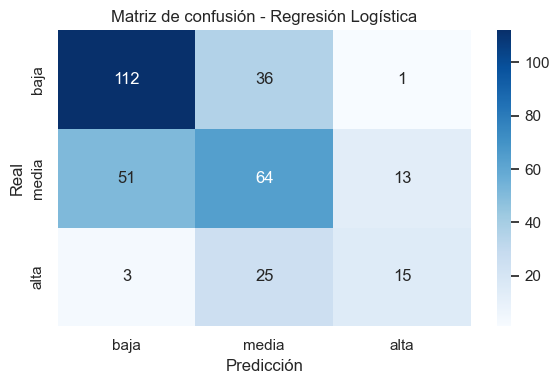


🔎 Modelo: Árbol de Decisión

📊 Reporte de clasificación:
              precision    recall  f1-score   support

        alta       0.67      0.70      0.68        43
        baja       0.76      0.72      0.74       149
       media       0.64      0.66      0.65       128

    accuracy                           0.70       320
   macro avg       0.69      0.70      0.69       320
weighted avg       0.70      0.70      0.70       320



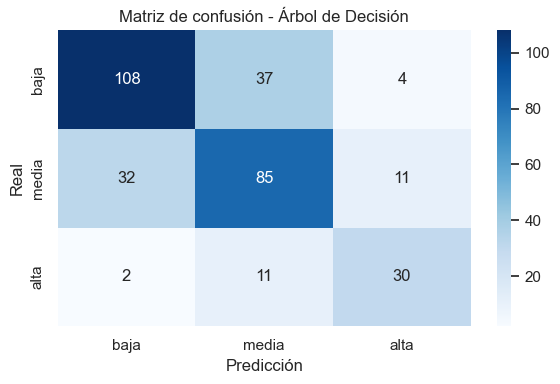


🔎 Modelo: Random Forest

📊 Reporte de clasificación:
              precision    recall  f1-score   support

        alta       0.68      0.63      0.65        43
        baja       0.79      0.83      0.81       149
       media       0.72      0.69      0.70       128

    accuracy                           0.75       320
   macro avg       0.73      0.72      0.72       320
weighted avg       0.74      0.75      0.75       320



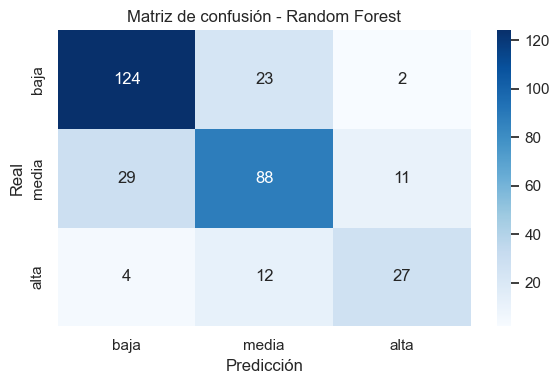

In [ ]:
# 1. Librerías
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix

# 2. Carga de datos
df = pd.read_csv("../data/raw/winequality-red.csv", sep=',')

# 3. Limpiar nombres de columnas
df.columns = df.columns.str.strip().str.lower()

# 4. Verificar existencia de 'quality'
if 'quality' not in df.columns:
    print("❌ ERROR: la columna 'quality' no se encuentra en el dataset.")
    print("Columnas actuales:", df.columns.tolist())
    raise SystemExit

# 5. Crear etiquetas de calidad (baja ≤5, media = 6, alta ≥7)
df['quality_label'] = df['quality'].apply(lambda q: 'baja' if q <= 5 else ('media' if q == 6 else 'alta'))

# 6. Verificar distribución de clases
print("\n✅ Distribución de clases:")
print(df['quality_label'].value_counts())

# 7. Dividir en X e y
X = df.drop(['quality', 'quality_label'], axis=1)
y = df['quality_label']

# 8. Separar en train/test
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# 9. Escalado
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 10. Modelos a entrenar
modelos = {
    "Regresión Logística": LogisticRegression(max_iter=1000),
    "Árbol de Decisión": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier()
}

# 11. Entrenamiento y evaluación
for nombre, modelo in modelos.items():
    print(f"\n🔎 Modelo: {nombre}")
    modelo.fit(X_train_scaled, y_train)
    y_pred = modelo.predict(X_test_scaled)
    
    print("\n📊 Reporte de clasificación:")
    print(classification_report(y_test, y_pred))
    
    cm = confusion_matrix(y_test, y_pred, labels=["baja", "media", "alta"])
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d',
                xticklabels=["baja", "media", "alta"],
                yticklabels=["baja", "media", "alta"],
                cmap="Blues")
    plt.title(f"Matriz de confusión - {nombre}")
    plt.xlabel("Predicción")
    plt.ylabel("Real")
    plt.tight_layout()
    plt.show()


para ver entre varaibles 

In [ ]:
# Obtener importancia de las características
importances = clf.feature_importances_# Crear gráfico de barras
plt.figure(figsize=(10, 6))
plt.barh(range(len(importances)), importances)
plt.yticks(range(len(importances)), X.columns)
plt.xlabel('Importancia')
plt.title('Importancia de las Características')
plt.show()

NameError: name 'clf' is not defined

In [ ]:
# --- 9. Guarda tu mejor modelo ---
print("\n--- PASO 9: Guardando el mejor modelo ---")
model_filename = 'mejor_modelo_pca_clasificacion.joblib'
joblib.dump(best_model, model_filename)
print(f"Mejor modelo guardado como '{model_filename}'")

